In [1]:
import numpy as np 
import pandas as pd 
import random
import torch
import os
from tqdm import tqdm
from torch.utils.data import random_split
import spacy 
import torch.nn as nn
import torch.optim as optim
from torch.nn.utils.rnn import pad_sequence
from torch.utils.tensorboard import SummaryWriter
import torchvision.transforms as transforms
import torchvision.models as models
from torch.utils.data import DataLoader, Dataset
from PIL import Image
from nltk.translate.bleu_score import sentence_bleu
import matplotlib.pyplot as plt
import nltk
nltk.download('wordnet')
nltk.download('punkt')

spacy_eng = spacy.load("en_core_web_sm")

2024-07-27 10:41:09.798934: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-27 10:41:09.799036: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-27 10:41:09.934446: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [2]:
!pip install -U nltk

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 36.4 MB/s eta 0:00:00
  Attempting uninstall: nltk
    Found existing installation: nltk 3.2.4
    Uninstalling nltk-3.2.4:
      Successfully uninstalled nltk-3.2.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
preprocessing 0.1.13 requires nltk==3.2.4, but you have nltk 3.8.1 which is incompatible.


In [3]:
from nltk.translate.bleu_score import corpus_bleu
from nltk.translate.meteor_score import meteor_score

In [4]:
class Vocabulary:
    def __init__(self, freq_threshold):
        self.itos = {0: "<PAD>", 1: "<SOS>", 2: "<EOS>", 3: "<UNK>"}
        self.stoi = {"<PAD>": 0, "<SOS>": 1, "<EOS>": 2, "<UNK>": 3}
        self.freq_threshold = freq_threshold

    def __len__(self):
        return len(self.itos)
    
    @staticmethod
    def tokenizer_eng(text):
        try:
            return [tok.text.lower() for tok in spacy_eng.tokenizer(text)]
        except:
            print(text)

    def build_vocabulary(self, sentence_list):
        frequencies = {}
        idx = 4

        for sentence in sentence_list:
            for word in self.tokenizer_eng(sentence):
                if word not in frequencies:
                    frequencies[word] = 1
                else:
                    frequencies[word] += 1

                if frequencies[word] == self.freq_threshold:
                    self.stoi[word] = idx
                    self.itos[idx] = word
                    idx += 1

    def numericalize(self, text):
        tokenized_text = self.tokenizer_eng(text)
        return [
            self.stoi[token] if token in self.stoi else self.stoi["<UNK>"]
            for token in tokenized_text
        ]

In [5]:
class FlickrDataset(Dataset):
    def __init__(self, root_dir, captions_file, transform=None, freq_threshold=5):
        self.root_dir = root_dir
        self.df =  pd.read_csv(captions_file ,delimiter='|')
        self.df =  self.df.dropna(subset=[' comment']).reset_index(drop=True)

        self.transform = transform

        self.imgs = [os.path.join(root_dir,'flickr30k_images',path_to_img) for path_to_img in self.df["image_name"]]
        self.captions = self.df[" comment"]
        self.vocab = Vocabulary(freq_threshold)
        self.vocab.build_vocabulary(self.captions.tolist())

    def __len__(self):
        return len(self.df)

    def __getitem__(self, index):
        caption = self.captions[index]
        img_id = self.imgs[index]
        img = Image.open(os.path.join(self.root_dir, img_id)).convert("RGB")

        if self.transform is not None:
            img = self.transform(img)

        numericalized_caption = [self.vocab.stoi["<SOS>"]]# start of sentence
        numericalized_caption += self.vocab.numericalize(caption)
        numericalized_caption.append(self.vocab.stoi["<EOS>"]) # end of sentence

        return img, torch.tensor(numericalized_caption)

In [6]:
class MyCollate:
    def __init__(self, pad_idx):
        self.pad_idx = pad_idx

    def __call__(self, batch):
        imgs = [item[0].unsqueeze(0) for item in batch]
        imgs = torch.cat(imgs, dim=0)
        targets = [item[1] for item in batch] 
        targets = pad_sequence(targets, batch_first=False, padding_value=self.pad_idx) # паддингует последовательности до единой длины

        return imgs, targets


In [7]:
def get_loader(
    root_folder,
    annotation_file,
    transform,
    train_size=0.99, 
    batch_size=32,
    num_workers=8,
    shuffle=True,
    pin_memory=True,
):
    dataset = FlickrDataset(root_folder, annotation_file, transform=transform)

    train_size = int(train_size * len(dataset))
    test_size = len(dataset) - train_size
    train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

    pad_idx = dataset.vocab.stoi["<PAD>"]

    train_loader = DataLoader(
        dataset=train_dataset,
        batch_size=batch_size,
        num_workers=num_workers,
        shuffle=shuffle,
        pin_memory=pin_memory,
        collate_fn=MyCollate(pad_idx=pad_idx),
    )

    test_loader = DataLoader(
        dataset=test_dataset,
        batch_size=batch_size,
        num_workers=num_workers,
        shuffle=False, 
        pin_memory=pin_memory,
        collate_fn=MyCollate(pad_idx=pad_idx),
    )

    return train_loader, test_loader, dataset


In [8]:
dir_to_pic = '/kaggle/input/flickr-image-dataset/flickr30k_images'
annotation_file = '/kaggle/input/flickr-image-dataset/flickr30k_images/results.csv'

size= 224
# Pre-process the image and convert into a tensor
transform = transforms.Compose([
     transforms.Resize(size),
     transforms.CenterCrop(size),
     transforms.ToTensor(),
     transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                      std=[0.229, 0.224, 0.225]),
 ])

train_loader, test_loader, dataset = get_loader(
   dir_to_pic, annotation_file, transform=transform
)

/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


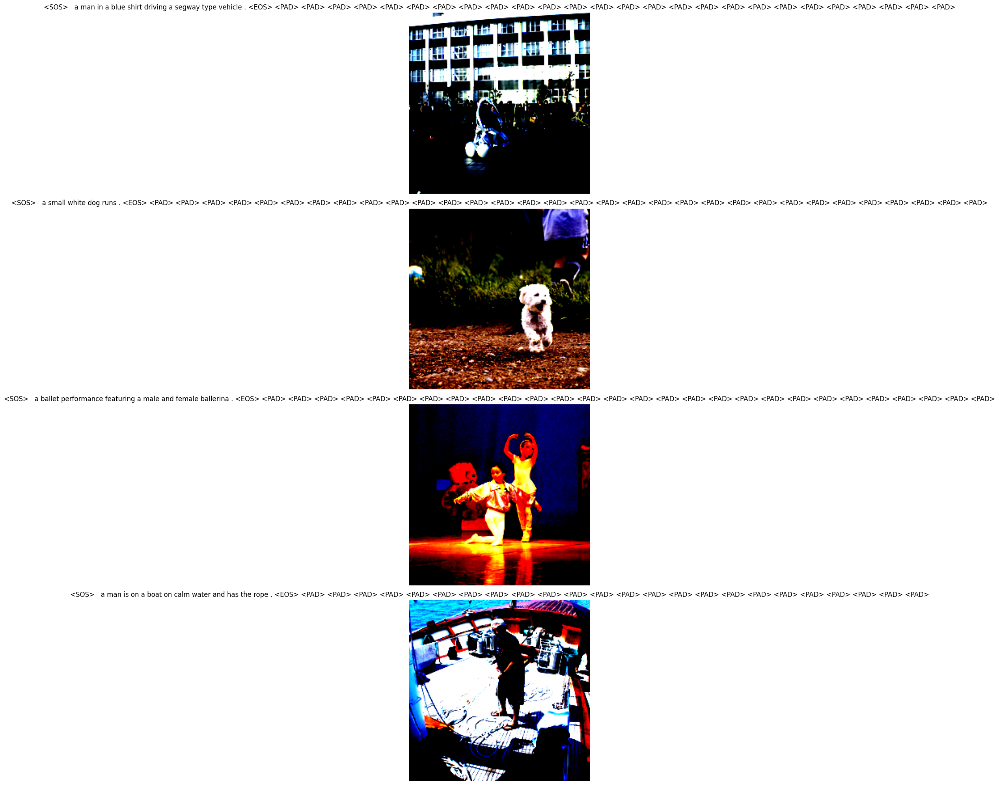

In [9]:
def visualize_captions(test_loader):
    imgs, captions = next(iter(test_loader))
    vocabulary = dataset.vocab
    captions_text = []
    
    for indx in range(len(imgs)):
        result_caption = captions[:,indx]

        caption_text = [vocabulary.itos[idx.item()] for idx in result_caption]
        captions_text.append(" ".join(caption_text))
    
    num_images = len(imgs)//8
    fig, axes = plt.subplots(nrows=num_images, ncols=1, figsize=(10, 5*num_images))

    for i in range(num_images):
        img = imgs[i].cpu().numpy().transpose(1, 2, 0)
        axes[i].imshow(img)
        axes[i].set_title(captions_text[i])
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()

visualize_captions(train_loader)

In [10]:
class EncoderCNN(nn.Module):
    def __init__(self, embed_size, train_CNN=False):
        super(EncoderCNN, self).__init__()
        self.train_CNN = train_CNN
        self.resnet = models.resnet50(pretrained=True)  # Загрузка ResNet-152
        self.resnet.fc = nn.Linear(self.resnet.fc.in_features, embed_size)  # Замена последнего полносвязного слоя
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)

    def forward(self, images):
        features = self.resnet(images)  # Пропуск изображений через ResNet
        features = self.relu(features)

        return self.dropout(features)


In [11]:
class DecoderRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers):
        super(DecoderRNN, self).__init__()
        
        self.embed = nn.Embedding(vocab_size, embed_size)
        self.lstm  = nn.LSTM(embed_size, hidden_size, num_layers)
        self.linear = nn.Linear(hidden_size, vocab_size)
        self.dropout      = nn.Dropout(0.5)
        
    def forward(self, features, captions):
        embeddings = self.dropout(self.embed(captions))
        embeddings = torch.cat((features.unsqueeze(0), embeddings), dim = 0)
        
        hiddens, _ = self.lstm(embeddings)
        outputs    = self.linear(hiddens)
        
        return outputs

In [12]:
class CNNtoRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers):
        super(CNNtoRNN, self).__init__()
        self.encoderCNN = EncoderCNN(embed_size)
        self.decodeRNN  = DecoderRNN(embed_size, hidden_size, vocab_size, num_layers)
        
    def forward(self, images, captions):
        features = self.encoderCNN(images)
        outputs = self.decodeRNN(features, captions)
        
        return outputs
    
    def caption_image(self, image, vocabulary, max_len = 30):
        result_caption = []
        
        with torch.no_grad():
            x = self.encoderCNN(image).unsqueeze(0)
            states = None
            
            for _ in range(max_len):
                hiddens, states = self.decodeRNN.lstm(x, states)
                output = self.decodeRNN.linear(hiddens.squeeze(0))
                predicted = output.argmax(1)
                result_caption.append(predicted.item())
                x = self.decodeRNN.embed(predicted).unsqueeze(0)
                
                if vocabulary.itos[predicted.item()] == "<EOS>":
                    break
                    
        return [vocabulary.itos[idx] for idx in result_caption]
    

In [13]:
def print_examples(model, device, dataset, num_examples=3, image_dir="/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images"):
    model.eval()
    
    all_images = [os.path.join(image_dir, fname) for fname in os.listdir(image_dir) if fname.endswith('.jpg')]
    selected_images = random.sample(all_images, num_examples)
    fig, axs = plt.subplots(num_examples, 1, figsize=(10, 5 * num_examples))
    
    if num_examples == 1:
        axs = [axs]  

    for i, image_path in enumerate(selected_images):
        test_img = transform(Image.open(image_path).convert("RGB")).unsqueeze(0)
        output_caption = " ".join(model.caption_image(test_img.to(device), dataset.vocab))
        
        axs[i].imshow(Image.open(image_path))
        axs[i].axis('off')
        axs[i].set_title(f"Output: {output_caption}", fontsize=12)
    
    plt.show()
    model.train()


def save_checkpoint(state, filename="my_checkpoint.pth.tar"):
    print("=> Saving checkpoint")
    torch.save(state, filename)


def load_checkpoint(checkpoint, model, optimizer):
    print("=> Loading checkpoint")
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])
    step = checkpoint["step"]
    return step

In [14]:
def cider_score(references, hypotheses):
    cider_scores = []
    for ref, hyp in zip(references, hypotheses):
        score = sentence_bleu([ref], hyp)
        cider_scores.append(score)
    avg_cider_score = sum(cider_scores) / len(cider_scores)
    return avg_cider_score

In [15]:
def test_model(model, device, dataset, loader):
    model.eval()
    
    references = []  
    hypotheses = []  

    with torch.no_grad():
        for images, captions in tqdm(loader):
            images = images.to(device)
            captions = captions.to(device)

            for indx in range(len(images)):
                references.append([dataset.vocab.itos[idx] for idx in captions[:, indx].tolist()])

            for img in images:
                img = img.unsqueeze(0) 
                output = model.caption_image(img, dataset.vocab)
                hypotheses.append(output)
                
    bleu_score = corpus_bleu(references, hypotheses)
    
    cider_avg_score = cider_score(references, hypotheses)

    return bleu_score, cider_avg_score

In [16]:

torch.backends.cudnn.benchmark = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
load_model = False
save_model = True
train_CNN = False

# Hyperparameters
embed_size = 256
hidden_size = 256
vocab_size = len(dataset.vocab)
num_layers = 1
learning_rate = 3e-4
num_epochs = 35


model = CNNtoRNN(embed_size, hidden_size, vocab_size, num_layers).to(device)
criterion = nn.CrossEntropyLoss(ignore_index=dataset.vocab.stoi["<PAD>"])
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

for name, param in model.encoderCNN.resnet.named_parameters():
    if "fc.weight" in name or "fc.bias" in name:
        param.requires_grad = True
    else:
        param.requires_grad = train_CNN

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 161MB/s]


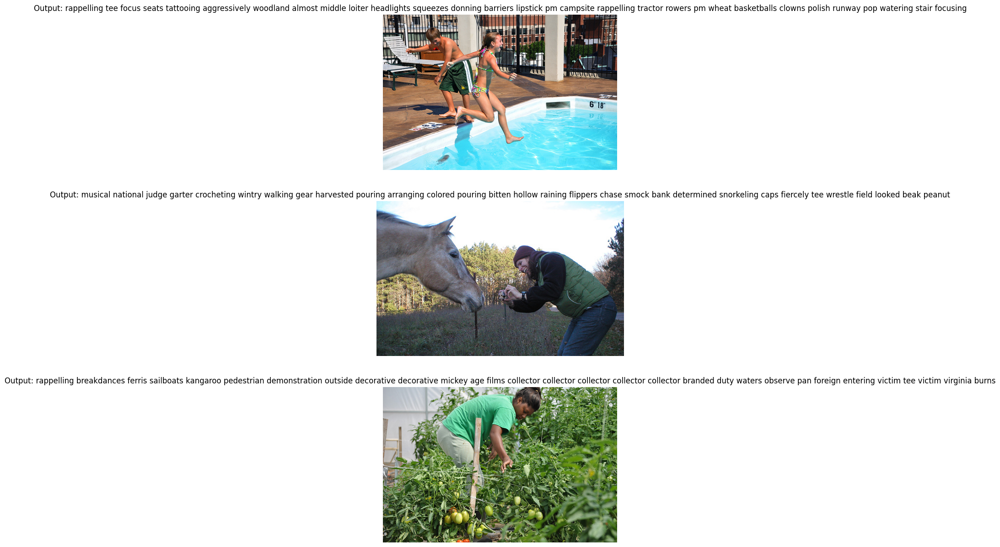

In [17]:
print_examples(model, device, dataset)

In [18]:
def train():
    if load_model:
        step = load_checkpoint(torch.load("my_checkpoint.pth.tar"), model, optimizer)

    for epoch in range(num_epochs):
        model.train()
        
        for idx, (imgs, captions) in tqdm(
            enumerate(train_loader), total=len(train_loader), leave=False
        ):
            imgs = imgs.to(device)
            captions = captions.to(device)

            outputs = model(imgs, captions[:-1])
            loss = criterion(
                outputs.reshape(-1, outputs.shape[2]), captions.reshape(-1)
            )
            optimizer.zero_grad()
            loss.backward(loss)
            optimizer.step()
        
        bleu_score, cider_avg_score = test_model(model, device, dataset,test_loader)
        
        print('bleu_score - {}, cider_avg_score - {}'.format(bleu_score, cider_avg_score))

        if save_model:
            checkpoint = {
                    "state_dict": model.state_dict(),
                    "optimizer": optimizer.state_dict(),
                    "bleu_score" : bleu_score,
                    "cider_avg_score" : cider_avg_score
                }
            save_checkpoint(checkpoint)
            
        if epoch%3 == 0:
            print_examples(model, device, dataset)

        print('='*10, 'Epoch {}'.format(epoch),'='*10)


100%|██████████| 50/50 [00:22<00:00,  2.18it/s]
/opt/conda/lib/python3.10/site-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  """
/opt/conda/lib/python3.10/site-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 4-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  """
/opt/conda/lib/python3.10/site-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 3-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  """


bleu_score - 0.6548614559889822, cider_avg_score - 0.15221212842531015
=> Saving checkpoint


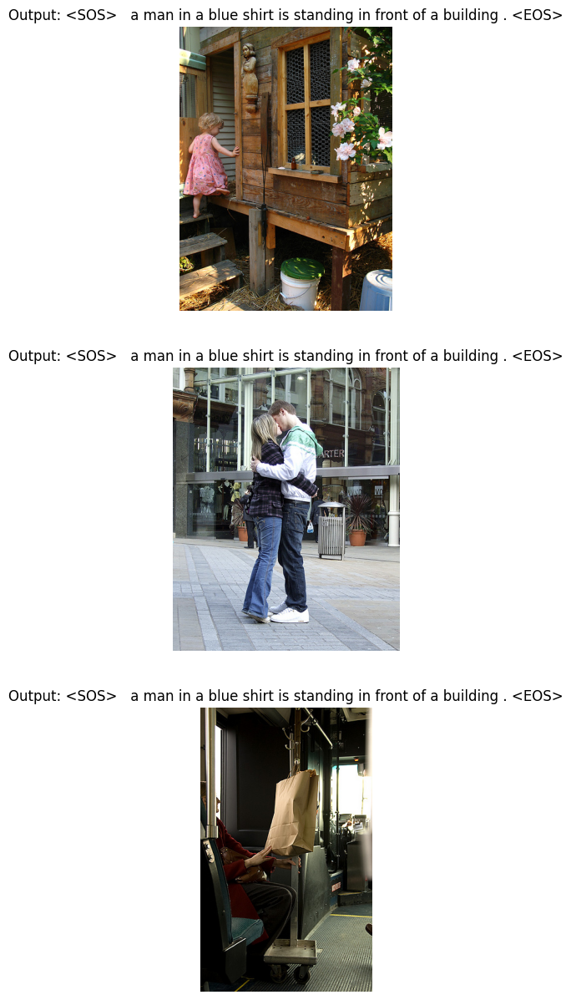

========== Epoch 0 ==========


100%|██████████| 50/50 [00:22<00:00,  2.18it/s]


bleu_score - 0.6666309518839616, cider_avg_score - 0.1378396933694096
=> Saving checkpoint
========== Epoch 1 ==========


100%|██████████| 50/50 [00:23<00:00,  2.16it/s]


bleu_score - 0.6574634720055945, cider_avg_score - 0.14624849348864233
=> Saving checkpoint
========== Epoch 2 ==========


100%|██████████| 50/50 [00:23<00:00,  2.13it/s]


bleu_score - 0.6526449509769945, cider_avg_score - 0.1524758287412455
=> Saving checkpoint


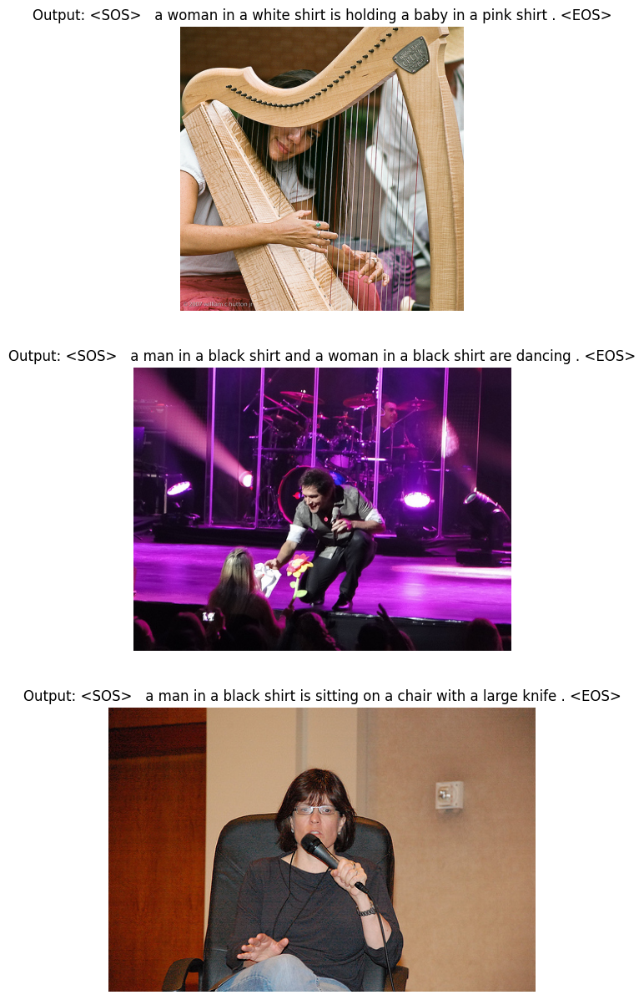

========== Epoch 3 ==========


100%|██████████| 50/50 [00:22<00:00,  2.19it/s]


bleu_score - 0.663767716533629, cider_avg_score - 0.13932120428720085
=> Saving checkpoint
========== Epoch 4 ==========


100%|██████████| 50/50 [00:23<00:00,  2.13it/s]


bleu_score - 0.6579248888507417, cider_avg_score - 0.14652043363852044
=> Saving checkpoint
========== Epoch 5 ==========


100%|██████████| 50/50 [00:23<00:00,  2.14it/s]


bleu_score - 0.6547123170256719, cider_avg_score - 0.14801292548929174
=> Saving checkpoint


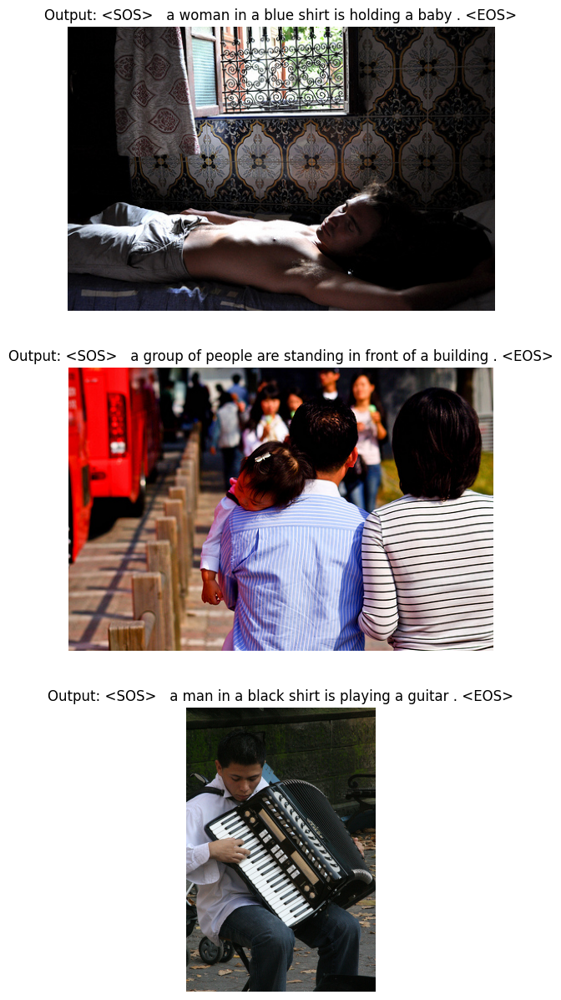

========== Epoch 6 ==========


100%|██████████| 50/50 [00:23<00:00,  2.15it/s]


bleu_score - 0.6562721049112752, cider_avg_score - 0.14782133674775255
=> Saving checkpoint
========== Epoch 7 ==========


100%|██████████| 50/50 [00:22<00:00,  2.18it/s]


bleu_score - 0.6580763745914375, cider_avg_score - 0.14753320002870032
=> Saving checkpoint
========== Epoch 8 ==========


100%|██████████| 50/50 [00:23<00:00,  2.15it/s]


bleu_score - 0.6554822158381691, cider_avg_score - 0.14955970777415004
=> Saving checkpoint


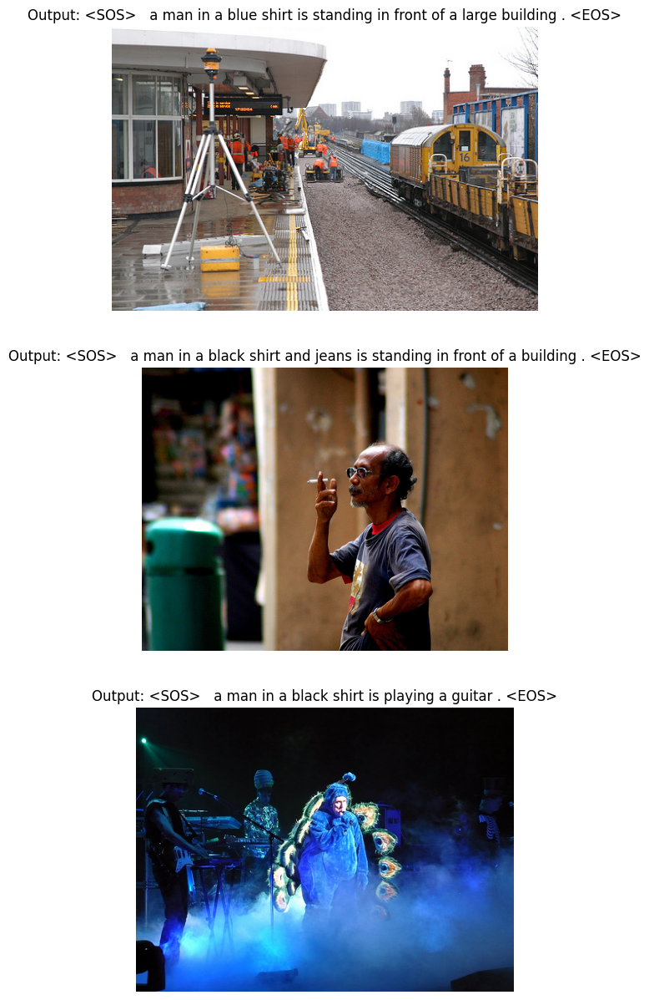

========== Epoch 9 ==========


100%|██████████| 50/50 [00:23<00:00,  2.17it/s]


bleu_score - 0.6555284640325862, cider_avg_score - 0.1492505185751117
=> Saving checkpoint
========== Epoch 10 ==========


100%|██████████| 50/50 [00:22<00:00,  2.17it/s]


bleu_score - 0.6573989273149475, cider_avg_score - 0.14625966397936394
=> Saving checkpoint
========== Epoch 11 ==========


100%|██████████| 50/50 [00:23<00:00,  2.13it/s]


bleu_score - 0.6426214027688931, cider_avg_score - 0.16037979102780348
=> Saving checkpoint


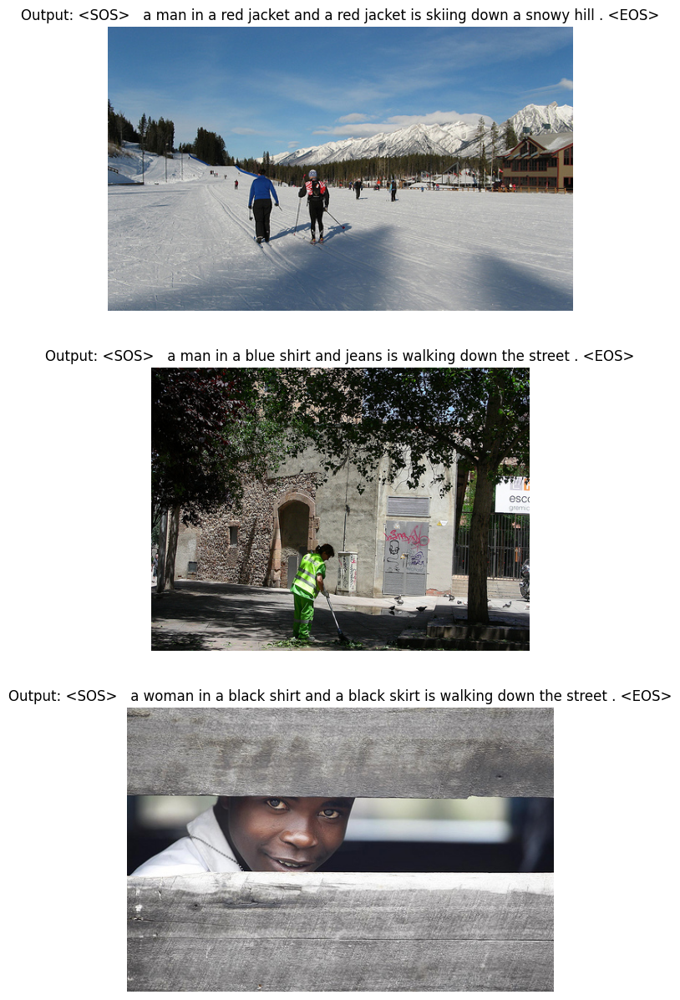

========== Epoch 12 ==========


100%|██████████| 50/50 [00:22<00:00,  2.18it/s]


bleu_score - 0.6516589785436282, cider_avg_score - 0.15382101031923398
=> Saving checkpoint
========== Epoch 13 ==========


100%|██████████| 50/50 [00:23<00:00,  2.12it/s]


bleu_score - 0.6477113274547771, cider_avg_score - 0.1562843410344866
=> Saving checkpoint
========== Epoch 14 ==========


100%|██████████| 50/50 [00:23<00:00,  2.13it/s]


bleu_score - 0.6515196855999446, cider_avg_score - 0.1527020279922899
=> Saving checkpoint


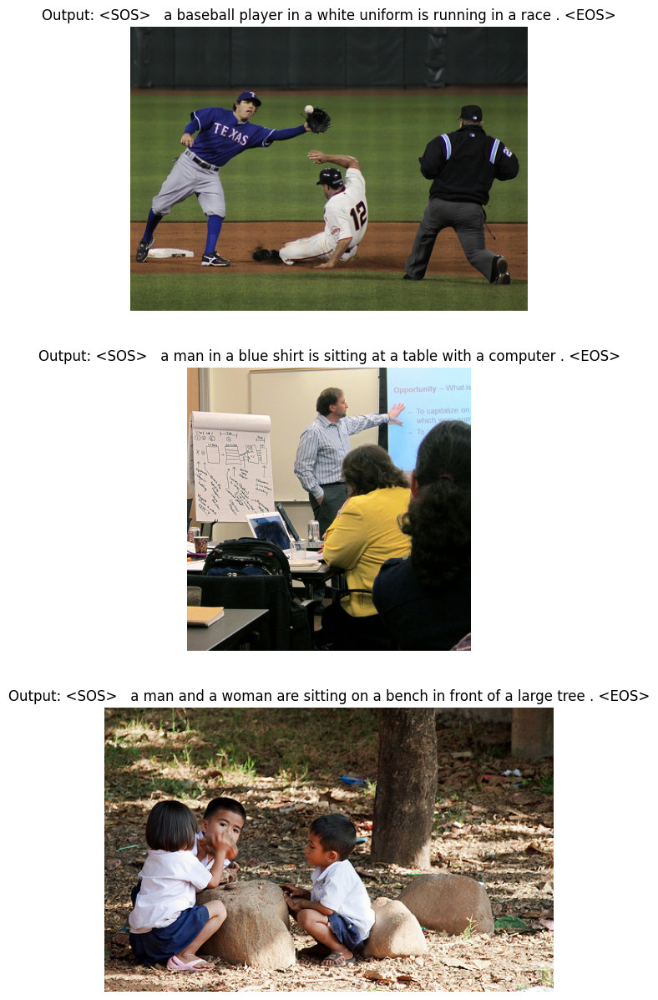

========== Epoch 15 ==========


100%|██████████| 50/50 [00:23<00:00,  2.16it/s]


bleu_score - 0.6552203237708568, cider_avg_score - 0.15072756819393907
=> Saving checkpoint
========== Epoch 16 ==========


100%|██████████| 50/50 [00:23<00:00,  2.17it/s]


bleu_score - 0.6580307865214607, cider_avg_score - 0.1492823994119459
=> Saving checkpoint
========== Epoch 17 ==========


100%|██████████| 50/50 [00:23<00:00,  2.16it/s]


bleu_score - 0.6573843299317842, cider_avg_score - 0.14759106358748356
=> Saving checkpoint


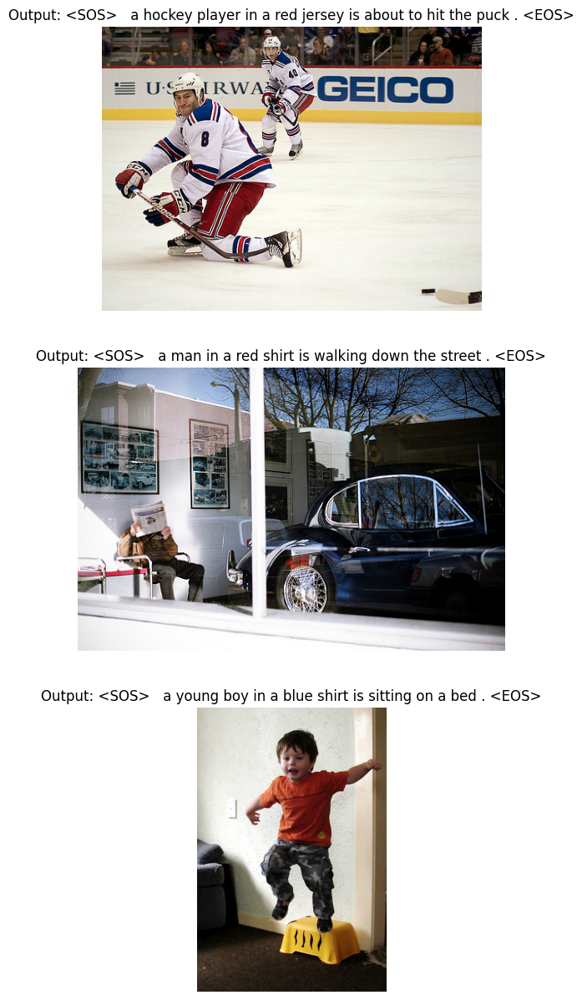

========== Epoch 18 ==========


100%|██████████| 50/50 [00:22<00:00,  2.18it/s]


bleu_score - 0.6599353092633179, cider_avg_score - 0.1461033742425062
=> Saving checkpoint
========== Epoch 19 ==========


100%|██████████| 50/50 [00:23<00:00,  2.17it/s]


bleu_score - 0.6565909688398357, cider_avg_score - 0.1486413253842049
=> Saving checkpoint
========== Epoch 20 ==========


100%|██████████| 50/50 [00:22<00:00,  2.20it/s]


bleu_score - 0.6600382746341956, cider_avg_score - 0.14562396038320016
=> Saving checkpoint


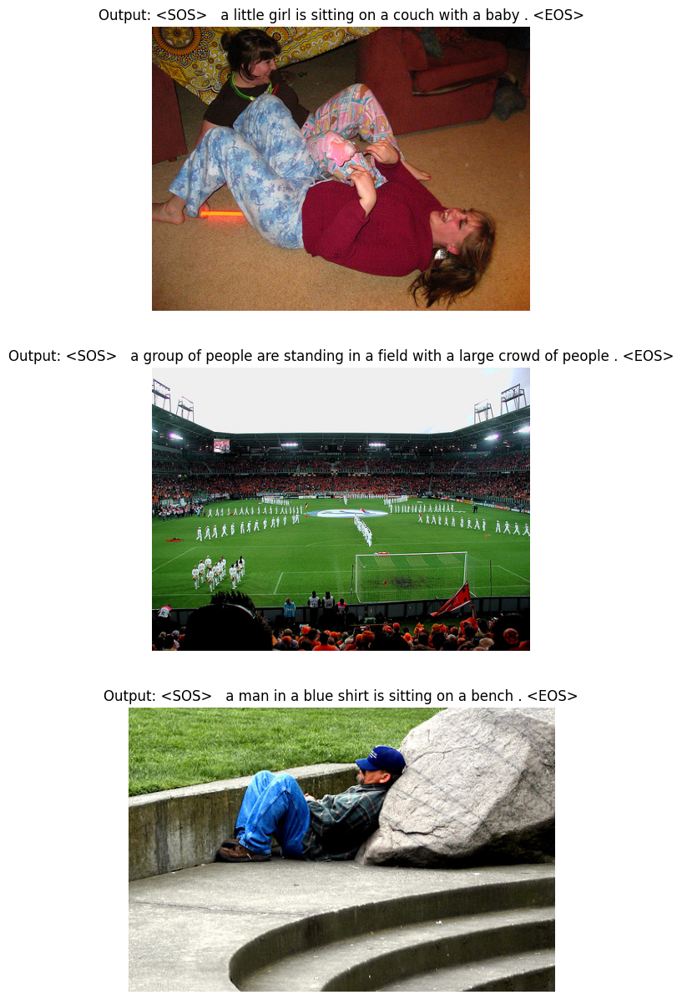

========== Epoch 21 ==========


100%|██████████| 50/50 [00:23<00:00,  2.15it/s]


bleu_score - 0.6499094478006417, cider_avg_score - 0.15320776761061378
=> Saving checkpoint
========== Epoch 22 ==========


100%|██████████| 50/50 [00:23<00:00,  2.17it/s]


bleu_score - 0.6585585584254915, cider_avg_score - 0.14689832442174233
=> Saving checkpoint
========== Epoch 23 ==========


100%|██████████| 50/50 [00:22<00:00,  2.18it/s]


bleu_score - 0.6587769028305144, cider_avg_score - 0.1459566854240575
=> Saving checkpoint


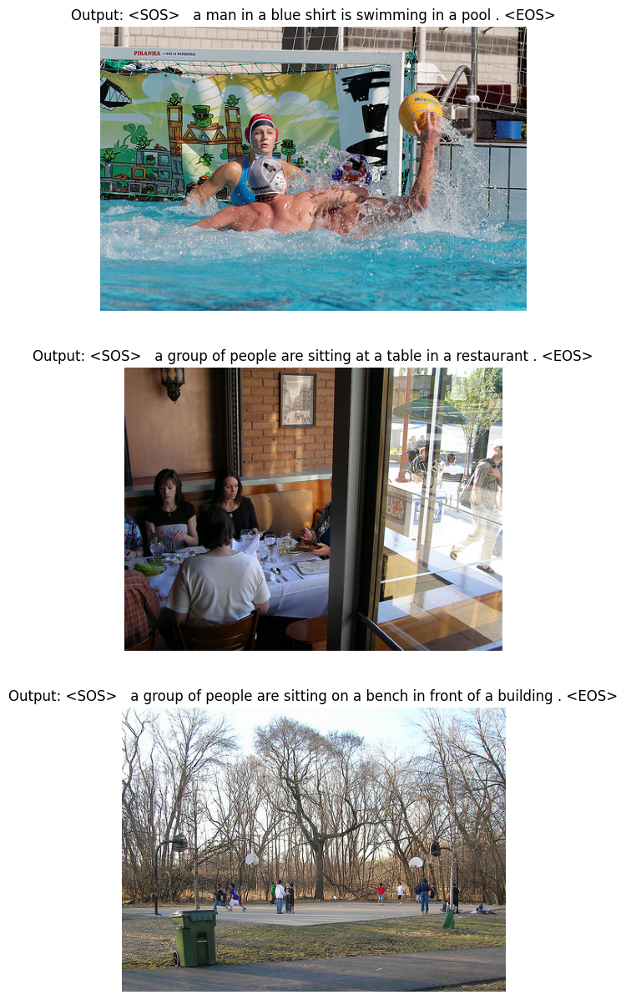

========== Epoch 24 ==========


100%|██████████| 50/50 [00:23<00:00,  2.17it/s]


bleu_score - 0.651503681956117, cider_avg_score - 0.15191967845327492
=> Saving checkpoint
========== Epoch 25 ==========


100%|██████████| 50/50 [00:23<00:00,  2.15it/s]


bleu_score - 0.6516211952382024, cider_avg_score - 0.15228069801638647
=> Saving checkpoint
========== Epoch 26 ==========


100%|██████████| 50/50 [00:23<00:00,  2.15it/s]


bleu_score - 0.6577801080109271, cider_avg_score - 0.14774883769032238
=> Saving checkpoint


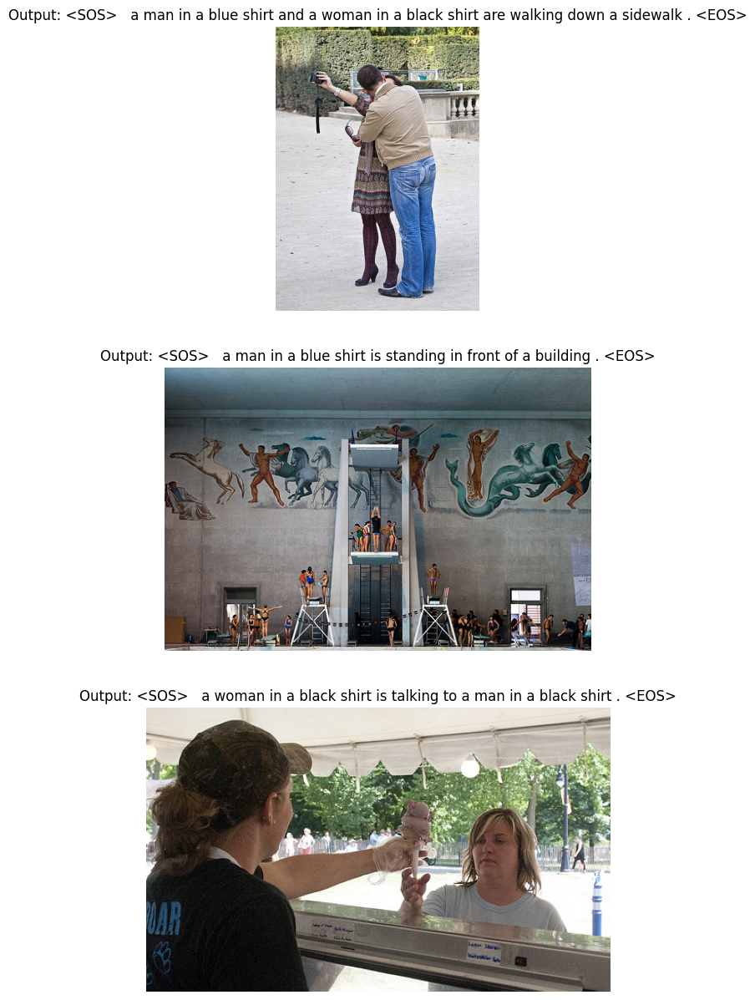

========== Epoch 27 ==========


100%|██████████| 50/50 [00:23<00:00,  2.13it/s]


bleu_score - 0.6545452324263153, cider_avg_score - 0.1491785447225548
=> Saving checkpoint
========== Epoch 28 ==========


100%|██████████| 50/50 [00:23<00:00,  2.15it/s]


bleu_score - 0.6532399864110535, cider_avg_score - 0.15083269872021202
=> Saving checkpoint
========== Epoch 29 ==========


100%|██████████| 50/50 [00:23<00:00,  2.13it/s]


bleu_score - 0.6549950075021946, cider_avg_score - 0.14998525884278058
=> Saving checkpoint


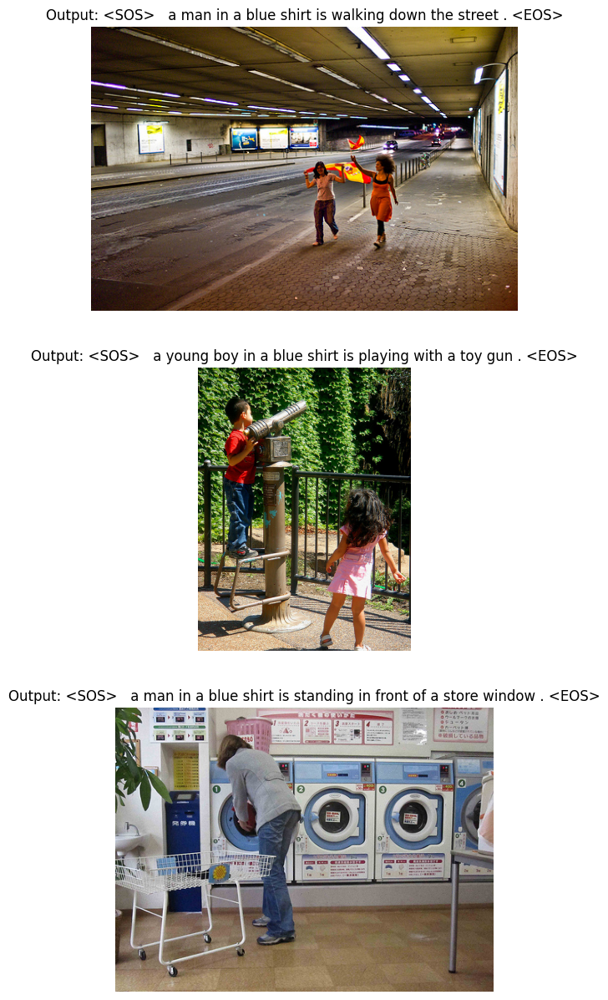

========== Epoch 30 ==========


100%|██████████| 50/50 [00:22<00:00,  2.20it/s]


bleu_score - 0.6650904092555558, cider_avg_score - 0.14036436717759038
=> Saving checkpoint
========== Epoch 31 ==========


100%|██████████| 50/50 [00:23<00:00,  2.17it/s]


bleu_score - 0.6546098539523854, cider_avg_score - 0.15019836256633556
=> Saving checkpoint
========== Epoch 32 ==========


100%|██████████| 50/50 [00:23<00:00,  2.12it/s]


bleu_score - 0.6655621620329976, cider_avg_score - 0.1422609845916338
=> Saving checkpoint


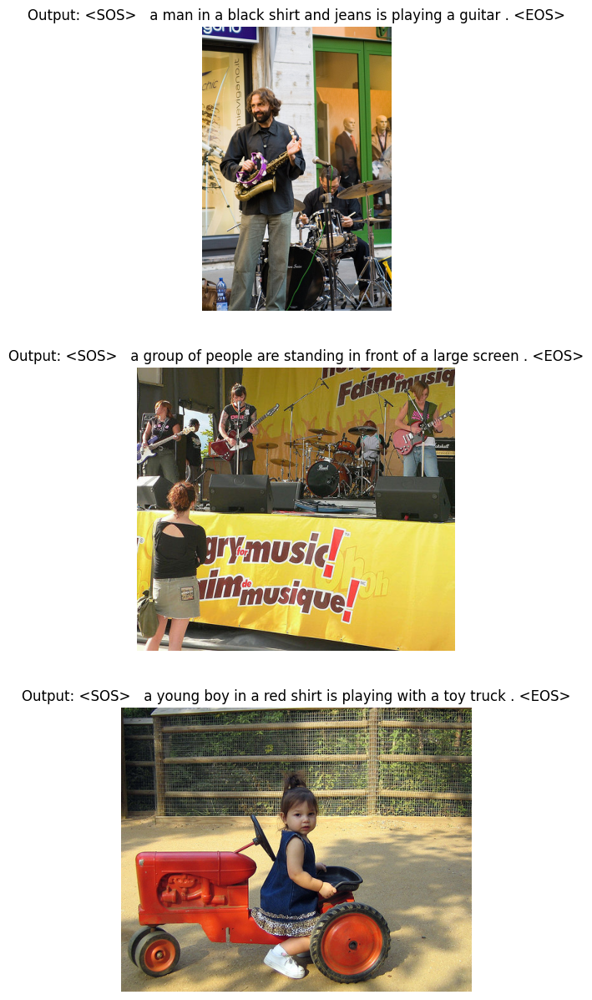

========== Epoch 33 ==========


100%|██████████| 50/50 [00:23<00:00,  2.14it/s]


bleu_score - 0.6526043994384736, cider_avg_score - 0.1532322102735159
=> Saving checkpoint
========== Epoch 34 ==========


In [19]:
train()

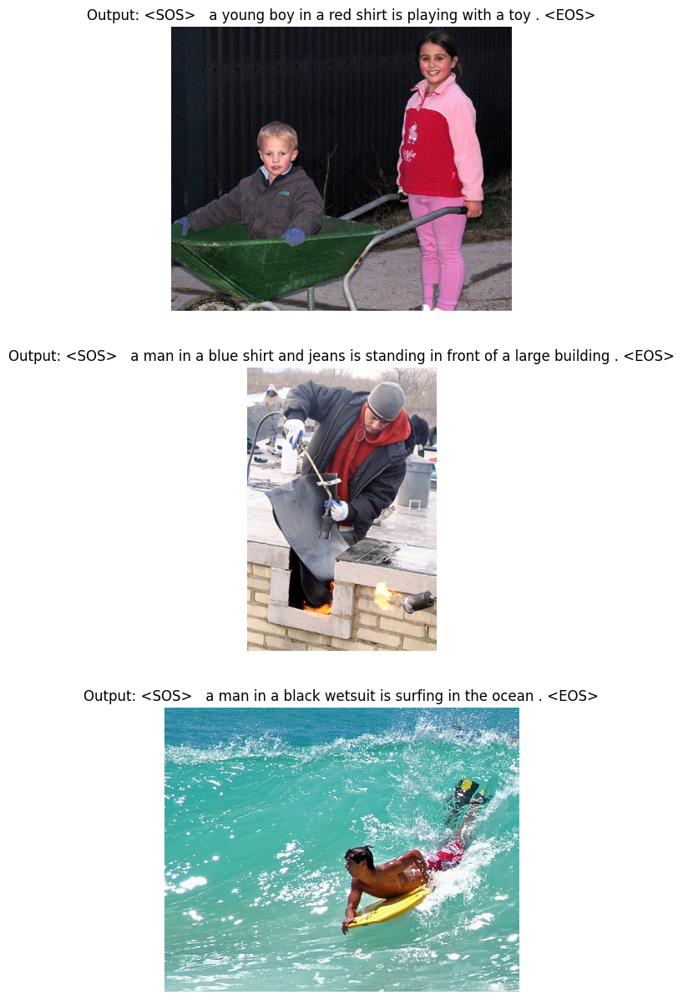

In [20]:
print_examples(model, device, dataset)